C:\Users\Sajjad\AppData\Local\Temp\ipykernel_12568\2286137819.py:120: UserWarning: frames=<function step_generator at 0x0000016473D1B100> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  ani = animation.FuncAnimation(


 Max step limit reached.
 Saved as 'schelling.gif'
[np.int64(587526)]


c:\Users\Sajjad\AppData\Local\Programs\Python\Python311\Lib\site-packages\matplotlib\animation.py:1762: UserWarning: Can not start iterating the frames for the initial draw. This can be caused by passing in a 0 length sequence for *frames*.

If you passed *frames* as a generator it may be exhausted due to a previous display or save.
  warnings.warn(


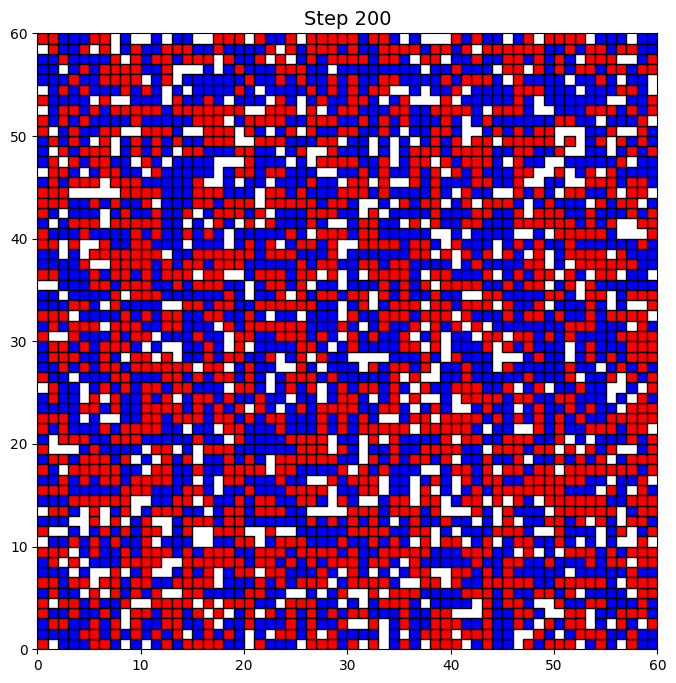

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
stops=[]
Bm=[]
#  Simulation Parameters 
grid_size = 60          # The grid will be 60x60
tolerance = 0.9        # Agents want at least 75% of neighbors to be similar
pause = 500             # Pause between frames in milliseconds
empty_spaces = 600      # Number of grid spaces that remain empty
max_steps = 200         # Safety limit to avoid infinite loops

#  Create a Figure and Axes 
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(0, grid_size)
ax.set_ylim(0, grid_size)

#  Initialize agent positions 
blue_agents = []     # List of blue agent positions
red_agents = []      # List of red agent positions
occupied = []        # Combined list of all filled positions
moves=[]

# Randomly place agents on the grid, keeping some empty cells
while len(occupied) < grid_size * grid_size - empty_spaces:
    x, y = np.random.randint(grid_size), np.random.randint(grid_size)
    if [x, y] not in occupied:
        if np.random.rand() < 0.5:
            blue_agents.append([x, y])
        else:
            red_agents.append([x, y])
        occupied.append([x, y])

#  State tracking
step = 0                # Current step number
stop_simulation = False # Flag to stop animation early when all agents are satisfied
total_moved=0
#  Update function: runs each animation frame 
def update(_):
    global blue_agents, red_agents, occupied, step, stop_simulation ,total_moved
    # Stop early if no one moved in previous step
    if stop_simulation:
        return

    # Clear the previous frame
    ax.clear()
    ax.set_xlim(0, grid_size)
    ax.set_ylim(0, grid_size)
    ax.set_title(f"Step {step + 1}", fontsize=14)
    moved = 0  # Count how many agents moved this step

    # Sub-function to move either blue or red agents
    def move_agents(agent_list, same_group, other_group, color):
        nonlocal moved 
        new_positions = []

        for agent in agent_list:
            similar = 0  # Count of similar neighbors
            total = 0    # Total neighbors checked
            x, y = agent

            # Check 8 neighbors (around current agent)
            for dx in [-1, 0, 1]:
                for dy in [-1, 0, 1]:
                    if dx == 0 and dy == 0:
                        continue  # Skip the agent itself
                    neighbor = [x + dx, y + dy]
                    if neighbor in same_group:
                        similar += 1
                        total += 1
                    elif neighbor in other_group:
                        total += 1

            # Calculate similarity ratio
            ratio = (similar + 1) / (total + 1)

            # If unhappy, move to a new random unoccupied spot
            if ratio < tolerance:
                new_x, new_y = np.random.randint(grid_size), np.random.randint(grid_size)
                while [new_x, new_y] in occupied:
                    new_x, new_y = np.random.randint(grid_size), np.random.randint(grid_size)
                occupied.remove(agent)              # Free the old position
                occupied.append([new_x, new_y])     # Mark new position as occupied
                new_positions.append([new_x, new_y])
                moved += 1
            else:
                new_positions.append(agent)

            # Draw the agent as a colored square on the plot
            ax.add_patch(plt.Rectangle(agent, 1, 1, facecolor=color, edgecolor='black'))

        return new_positions

    # Move both blue and red agents
    blue_agents[:] = move_agents(blue_agents, blue_agents, red_agents, 'blue')
    red_agents[:] = move_agents(red_agents, red_agents, blue_agents, 'red')
    moves.append(moved)
    step += 1  # Increase the step count

    # If no agents moved, everyone is satisfied — stop simulation
    if moved == 0:
        stops.append(np.sum(np.array(moves)))
        Bm.append(tolerance)
        print(f" All agents satisfied at step {step}")
        stop_simulation = True

    # Optional safety: stop after too many steps
    if step >= max_steps:
        stops.append(np.sum(np.array(moves)))
        print(" Max step limit reached.")
        stop_simulation = True

# === Generator for frames (used by FuncAnimation) ===
# Keeps yielding frames until the simulation is complete
def step_generator():
    while not stop_simulation:
        yield  # Just tells animation to continue — update() does the real work

# === Run the animation ===
ani = animation.FuncAnimation(
    fig,
    update,
    frames=step_generator,  # Use generator so we can stop early
    interval=pause,
    repeat=False
)

# === Save the animation to a GIF ===
# Note: this will still loop through all frame requests from the generator
ani.save("schelling.gif", writer="pillow")
print(" Saved as 'schelling.gif'")
print(stops)

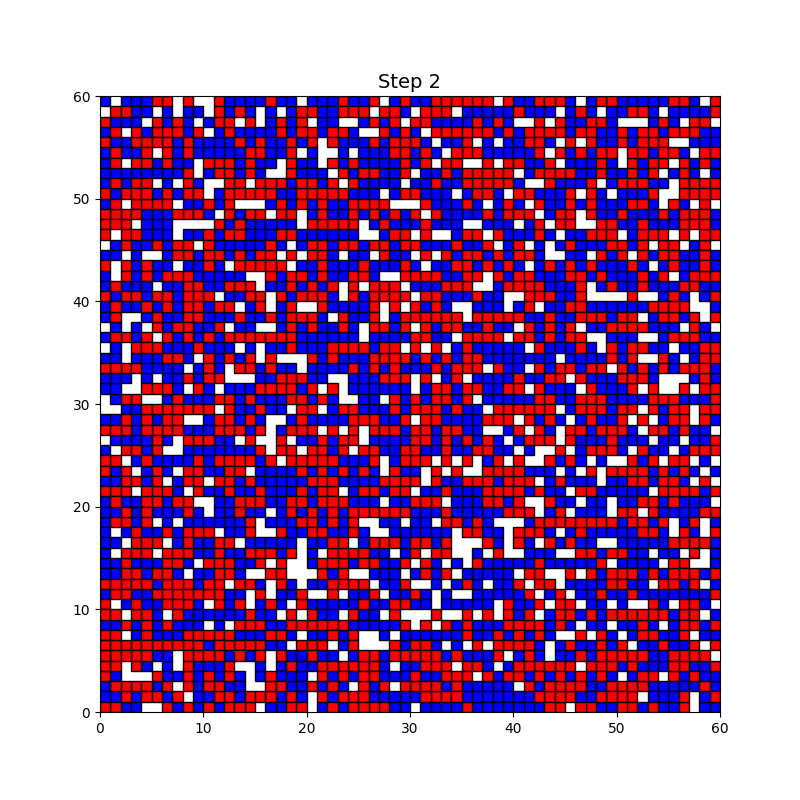

In [34]:
from IPython.display import Image
Image(filename="schelling.gif")


In [ ]:
tolerance = 0.8      # Agents want at least 75% of neighbors to be similar
empty_spaces = 600
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(0, grid_size)
ax.set_ylim(0, grid_size)
blue_agents = []     # List of blue agent positions
red_agents = []      # List of red agent positions
occupied = [] 
moves = []
while len(occupied) < grid_size * grid_size - empty_spaces:
    x, y = np.random.randint(grid_size), np.random.randint(grid_size)
    if [x, y] not in occupied:
        if np.random.rand() < 0.5:
            blue_agents.append([x, y])
        else:
            red_agents.append([x, y])
        occupied.append([x, y])
step = 0                # Current step number
stop_simulation = False
ani = animation.FuncAnimation(
    fig,
    update,
    frames=step_generator,  # Use generator so we can stop early
    interval=pause,
    repeat=False
)

# === Save the animation to a GIF ===
# Note: this will still loop through all frame requests from the generator
ani.save("schelling.gif", writer="pillow")
print(" Saved as 'schelling.gif'")
print(stops)

C:\Users\Sajjad\AppData\Local\Temp\ipykernel_12568\2560718586.py:20: UserWarning: frames=<function step_generator at 0x0000016473D1B100> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  ani = animation.FuncAnimation(


 Max step limit reached.
